In [1]:

import matplotlib.cm as cm
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse 
import numpy as np
import pandas as pd
from pandas.plotting import scatter_matrix as sm
from scipy.spatial.distance import cdist
import seaborn as sns
from sklearn import preprocessing
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.mixture import GaussianMixture
from sklearn.metrics.cluster import adjusted_rand_score


In this project, we will take use some self-defined functions to plot the 2-D K-Means.

# Import Data
In this project, we use [Wine Dataset](http://archive.ics.uci.edu/ml/datasets/Wine) to cluster different types of wines. This data set contains the results of a chemical analysis of wines grown in a specific area of Italy.

The attributes are (dontated by Riccardo Leardi, riclea@anchem.unige.it ):
1. Alcohol
2. Malic acid
3. Ash
4. Alcalinity of ash  
5. Magnesium
6. Total phenols
7. Flavanoids
8. Nonflavanoid phenols
9. Proanthocyanins
10. Color intensity
11. Hue
12. OD280/OD315 of diluted wines
13. Proline 

Variable `Label` include the true labels of different wine.

In [3]:
data = pd.read_csv("wine.data.csv")

# Keep the 1st column (Label) into a separate variable and remove it from the DataFrame
label = data["Label"]
data = data.drop("Label", axis=1)

# Display the separated label and the DataFrame without the Label column
print("Label:")
print(label.head())
print("\nDataFrame without Label column:")
print(data.head())

Label:
0    1
1    1
2    1
3    1
4    1
Name: Label, dtype: int64

DataFrame without Label column:
   Alcohol  Malic acid   Ash  Alcalinity of ash  Magnesium  Total phenols  \
0    14.23        1.71  2.43               15.6        127           2.80   
1    13.20        1.78  2.14               11.2        100           2.65   
2    13.16        2.36  2.67               18.6        101           2.80   
3    14.37        1.95  2.50               16.8        113           3.85   
4    13.24        2.59  2.87               21.0        118           2.80   

   Flavanoids  Nonflavanoid phenols  Proanthocyanins  Color intensity   Hue  \
0        3.06                  0.28             2.29             5.64  1.04   
1        2.76                  0.26             1.28             4.38  1.05   
2        3.24                  0.30             2.81             5.68  1.03   
3        3.49                  0.24             2.18             7.80  0.86   
4        2.69                  0.39      

From the table above we can get that there are 178 instances of wine and 13 attributes and for each attribute, the distribution differ a lot. Then we are going to plot the scatter plot of the dataset `wine` as follow:

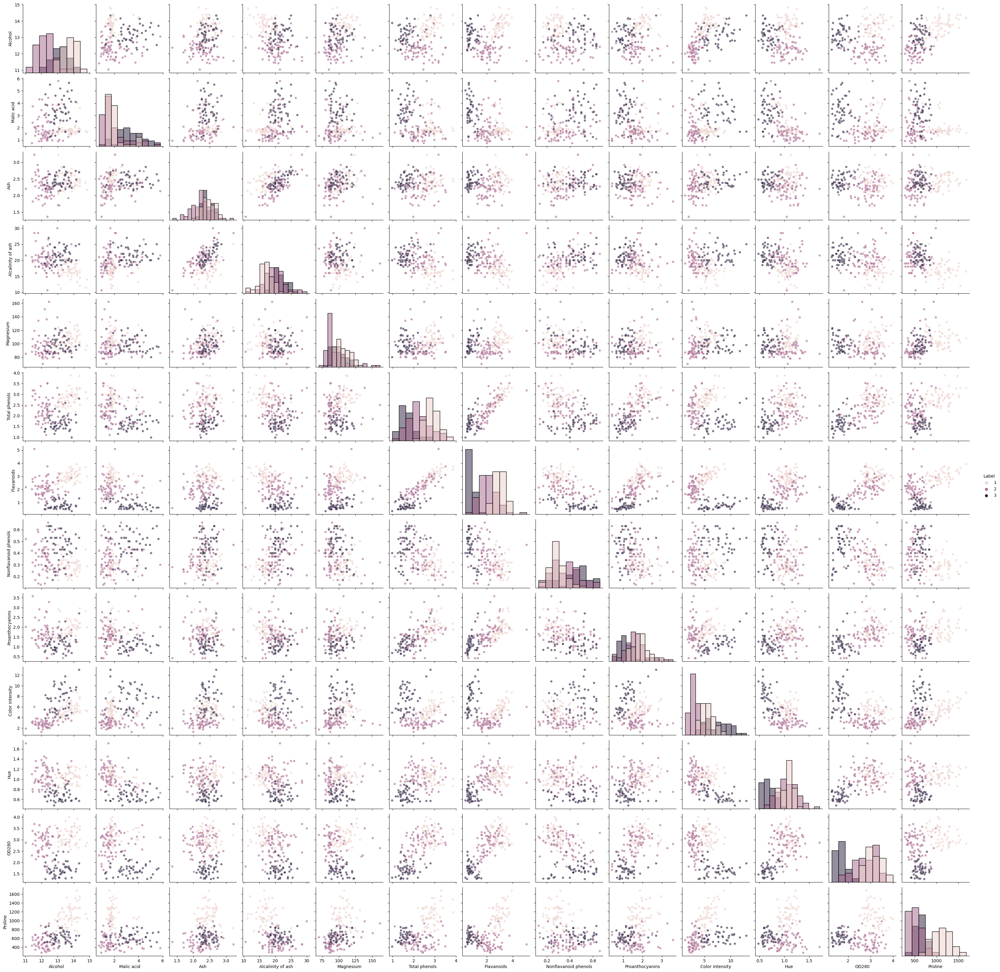

In [7]:
# Temporarily add the 'Label' column back to the DataFrame for the pairplot
data["Label"] = label

# Create scatter plots for each pair of attributes
sns.pairplot(data, hue="Label", diag_kind="hist", markers='o', plot_kws={'alpha': 0.6, 's': 30})

# Remove the 'Label' column from the DataFrame
data = data.drop("Label", axis=1)


plt.show()

From the scatter plot, it's hard for us to cluster the data.

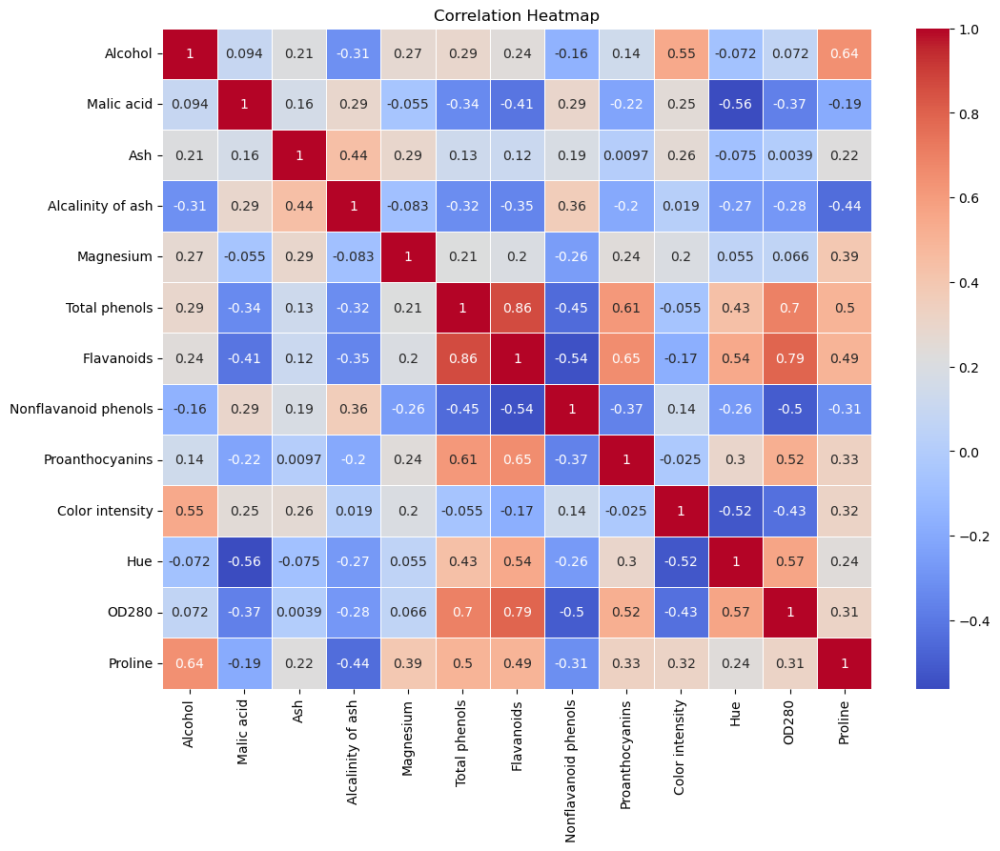

Three pairs of attributes with the largest correlation:
Total phenols  Flavanoids       0.864564
Flavanoids     Total phenols    0.864564
OD280          Flavanoids       0.787194
Flavanoids     OD280            0.787194
OD280          Total phenols    0.699949
Total phenols  OD280            0.699949
dtype: float64


In [8]:
# Calculate the correlation matrix
corr_matrix = data.corr()

# Create a heatmap of the correlations
plt.figure(figsize=(12, 9))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=.5)
plt.title("Correlation Heatmap")
plt.show()

# Find the three pairs of attributes with the largest correlation
corr_matrix_unstacked = corr_matrix.abs().unstack()
strongest_pairs = corr_matrix_unstacked.sort_values(ascending=False)
strongest_pairs = strongest_pairs[strongest_pairs < 1]  # exclude self-correlations (1.0)

print("Three pairs of attributes with the largest correlation:")
print(strongest_pairs.head(6))  # show top 6 elements as each pair is listed twice (A vs. B and B vs. A)

From the heatmap above, we can conclude that the correlation between

* "Flavanoids" and "Total phenols" (`0.86`);
* "OD280" and "Flavanoids" (`0.79`);
* "OD280" and "Total phenols" (`0.7`);

are large.

Then we can plot the regression of "Flavanoids" on "Total phenols" as follow:

# [K-Means Clustering](https://en.wikipedia.org/wiki/K-means_clustering)


In [9]:
!pip show seaborn
!pip show matplotlib

Name: seaborn
Version: 0.11.2
Summary: seaborn: statistical data visualization
Home-page: https://seaborn.pydata.org
Author: Michael Waskom
Author-email: mwaskom@gmail.com
License: BSD (3-clause)
Location: d:\anaconda\lib\site-packages
Requires: matplotlib, numpy, pandas, scipy
Required-by: 
Name: matplotlib
Version: 3.5.2
Summary: Python plotting package
Home-page: https://matplotlib.org
Author: John D. Hunter, Michael Droettboom
Author-email: matplotlib-users@python.org
License: PSF
Location: d:\anaconda\lib\site-packages
Requires: cycler, fonttools, kiwisolver, numpy, packaging, pillow, pyparsing, python-dateutil
Required-by: seaborn


## K-Means
Use kMeans with k=3 to cluster the normalized. Use pairplot to visualize the wine 
attributes with their cluster.  

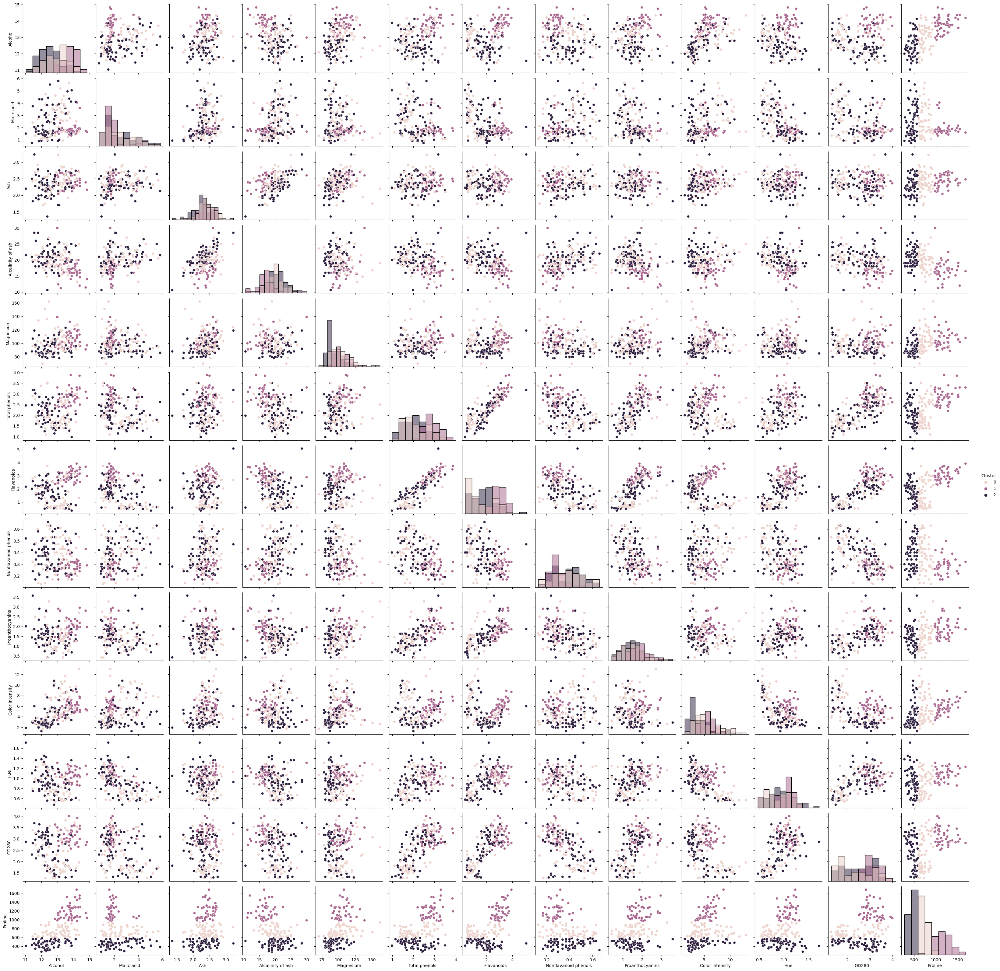

In [25]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
# Load data from the wine.data.csv file
data = pd.read_csv("wine.data.csv")

# Keep the 1st column (Label) into a separate variable and remove it from the DataFrame
label = data["Label"]
data = data.drop("Label", axis=1)

# Perform k-means clustering with k=3
kmeans = KMeans(n_clusters=3, random_state=0)
kmeans.fit(data)
clusters = kmeans.labels_

# Add cluster labels to the DataFrame
data["Cluster"] = clusters

# Create a pairplot with cluster labels as the hue
sns.pairplot(data, hue="Cluster", diag_kind="hist")

plt.show()


Normalize data by removing the mean and scaling to unit variance using 
`preprocessing.StandardScaler` and do kMeans again. 

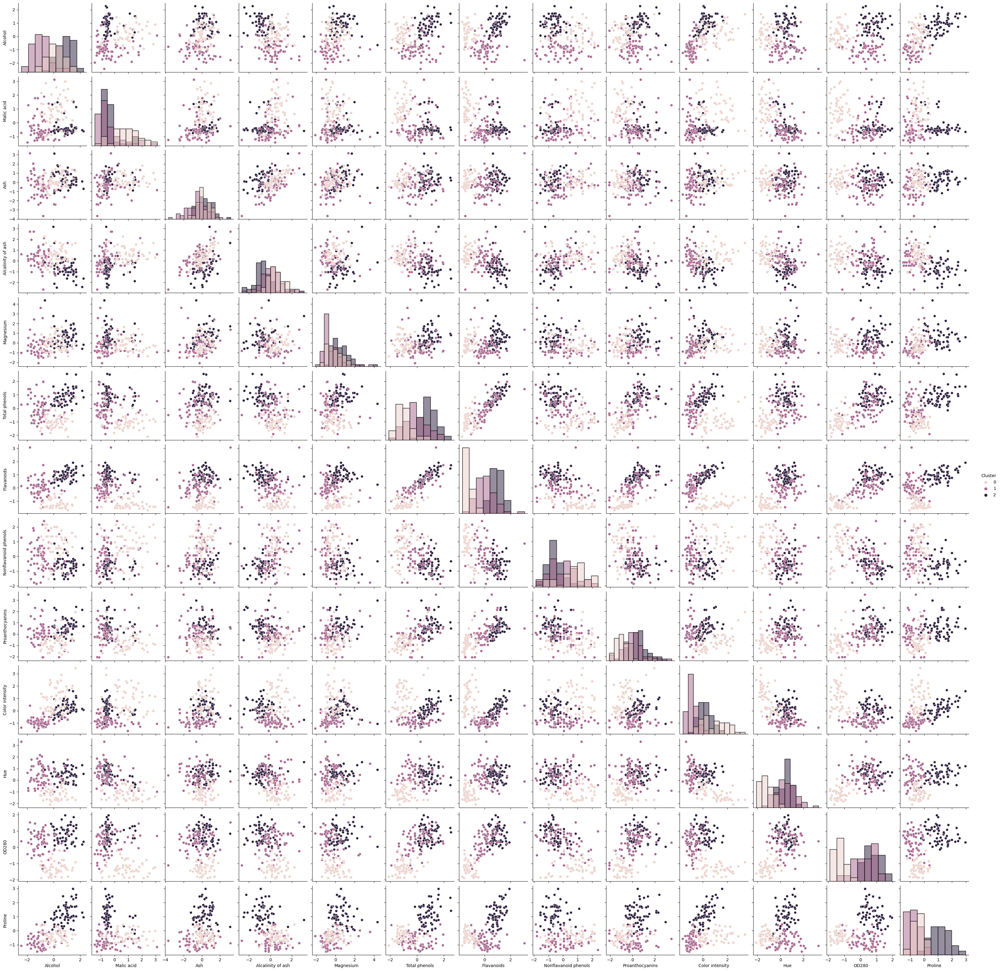

In [21]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

# Load data from the wine.data.csv file
data = pd.read_csv("wine.data.csv")

# Keep the 1st column (Label) into a separate variable and remove it from the DataFrame
label = data["Label"]
data = data.drop("Label", axis=1)

# Normalize the data using StandardScaler
scaler = StandardScaler()
normalized_data = scaler.fit_transform(data)
normalized_data = pd.DataFrame(normalized_data, columns=data.columns)

# Perform k-means clustering with k=3
kmeans = KMeans(n_clusters=3, random_state=0)
kmeans.fit(normalized_data)
clusters = kmeans.labels_

# Add cluster labels to the DataFrame
normalized_data["Cluster"] = clusters

# Create a pairplot with cluster labels as the hue
sns.pairplot(normalized_data, hue="Cluster", diag_kind="hist")

plt.show()

By using explained_variance_ratio_ attribute, we know that first 6 PCs explain 85.1% of 
variance if we reduce the dimension using PCA. You need to apply PCA with 6 
components for the above normalized data. Then applying kMeans (3 clusters) to cluster 
the data after dimensionality reduction. 

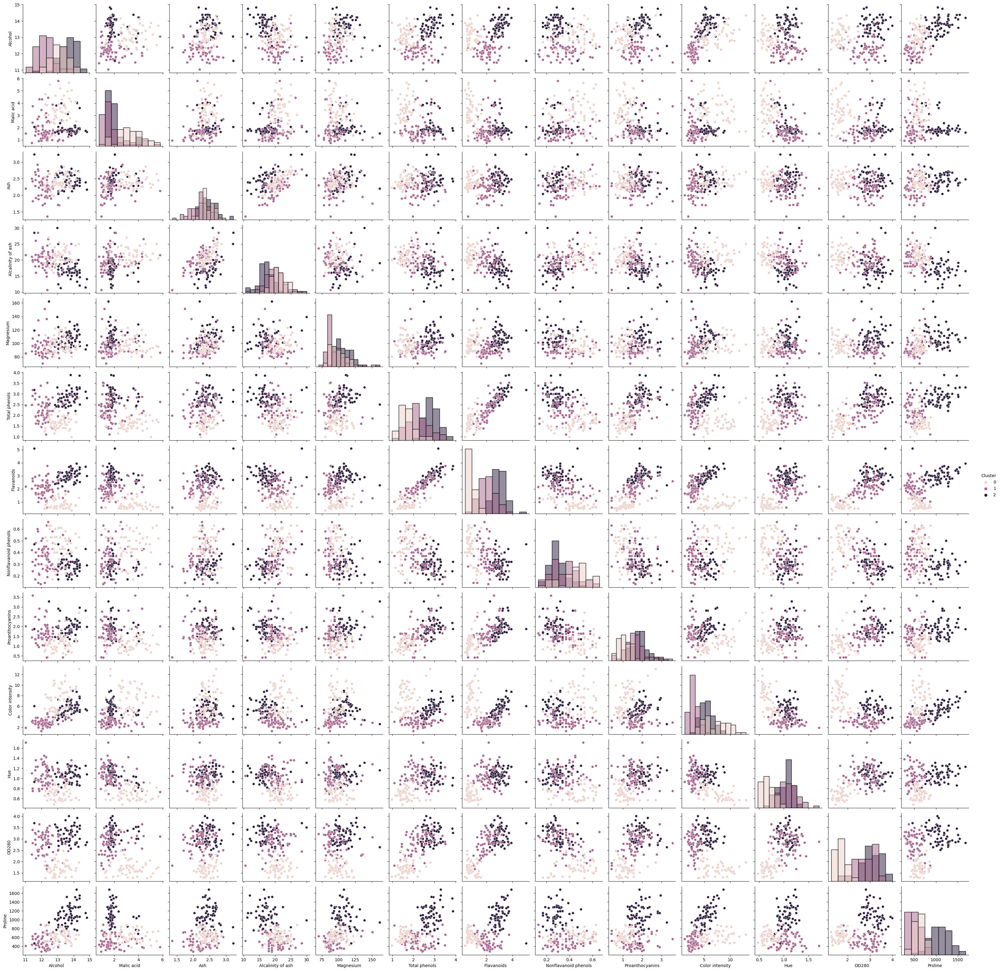

In [22]:
# Load data from the wine.data.csv file
data = pd.read_csv("wine.data.csv")

# Keep the 1st column (Label) into a separate variable and remove it from the DataFrame
label = data["Label"]
data = data.drop("Label", axis=1)

# Normalize the data using StandardScaler
scaler = StandardScaler()
normalized_data = scaler.fit_transform(data)

# Apply PCA with 6 components
pca = PCA(n_components=6)
reduced_data = pca.fit_transform(normalized_data)

# Perform k-means clustering with k=3
kmeans = KMeans(n_clusters=3, random_state=0)
kmeans.fit(reduced_data)
clusters = kmeans.labels_

# Visualize the results
reduced_data_df = pd.DataFrame(data)
reduced_data_df['Cluster'] = clusters

sns.pairplot(reduced_data_df, hue="Cluster", diag_kind="hist")

plt.show()

Use adjusted_rand_score in sklearn.metrics.cluster to calculate the scores of original 
kMeans and kMeans after PCA. What is your conclusion?  

In [24]:
# Load data from the wine.data.csv file
data = pd.read_csv("wine.data.csv")

# Keep the 1st column (Label) into a separate variable and remove it from the DataFrame
label = data["Label"]
data = data.drop("Label", axis=1)

# Normalize the data using StandardScaler
scaler = StandardScaler()
normalized_data = scaler.fit_transform(data)

# Perform k-means clustering with k=3 on the normalized data
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(normalized_data)
clusters = kmeans.labels_

# Calculate the adjusted Rand score for the original k-means clustering
original_ari = adjusted_rand_score(label, clusters)

# Apply PCA with 6 components and perform k-means clustering with k=3 on the reduced data
pca = PCA(n_components=6)
reduced_data = pca.fit_transform(normalized_data)

kmeans_pca = KMeans(n_clusters=3, random_state=0)
kmeans_pca.fit(reduced_data)
clusters_pca = kmeans_pca.labels_

# Calculate the adjusted Rand score for the k-means clustering after PCA
pca_ari = adjusted_rand_score(label, clusters_pca)

print(f"Adjusted Rand score for the original k-means clustering: {original_ari}")
print(f"Adjusted Rand score for the k-means clustering after PCA: {pca_ari}")

Adjusted Rand score for the original k-means clustering: 0.8974949815093207
Adjusted Rand score for the k-means clustering after PCA: 0.8974949815093207


It means that the dimensionality reduction with PCA did not affect the clustering results.